### Dashtoon Style Transfer Assignment

Hi I am Shekhar and based on the assignment, I have made a Streamlit webapp to demonstrate the style transfer for a user, below are some of the scrrenshots from the webapp UI - 
- so basically it has 3 styles available right now
    - modern art
    - Game art 
    - manga sketch

##### Home page - here the style images are shown, and there is an upload button for the original image

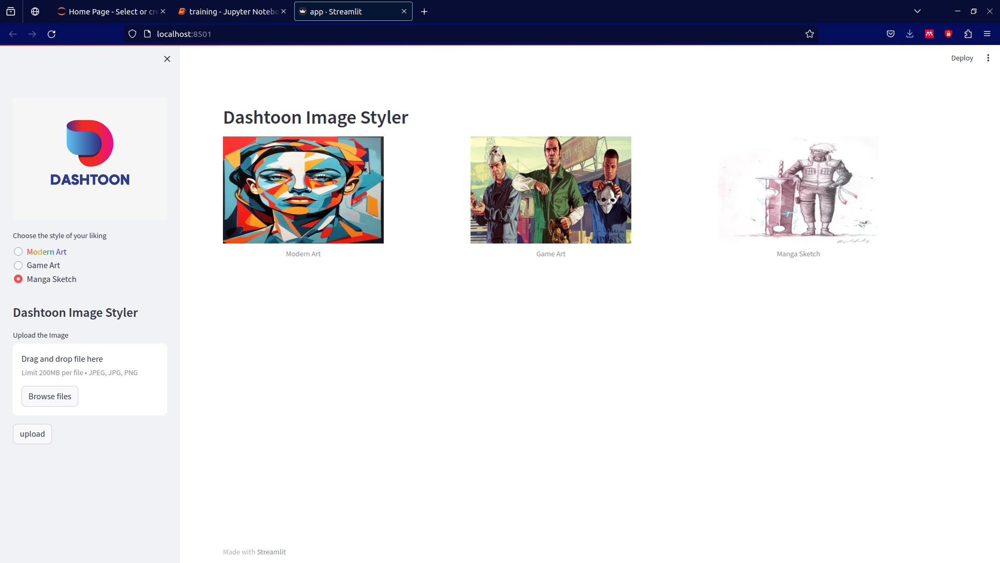

In [141]:
from IPython.display import Image
Image(filename='streamlit-app_ui/ui_home.png')  

- after selecting modern art as the style image

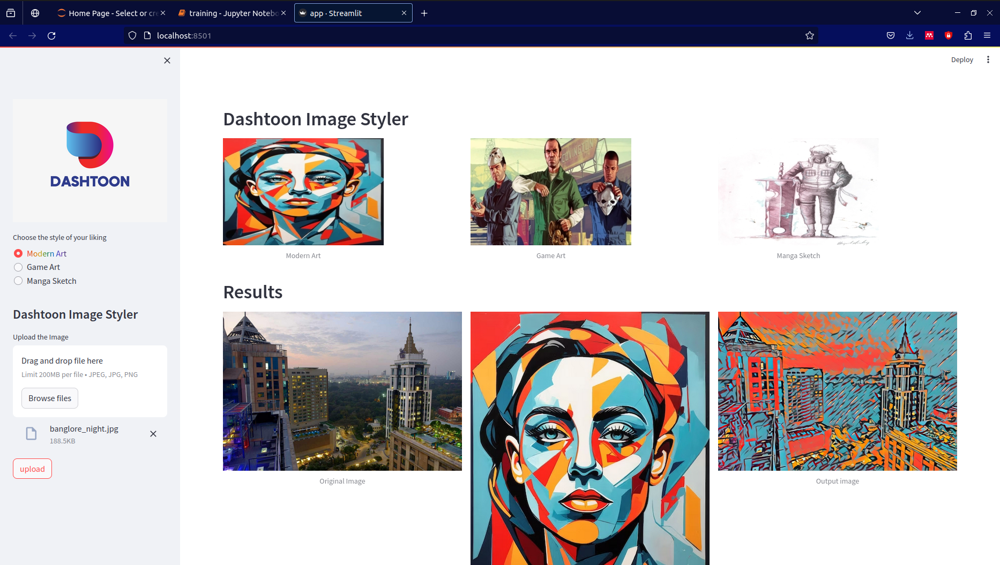

In [142]:
Image(filename='streamlit-app_ui/ui_modern_art.png') 

- after selecting game art as the style image

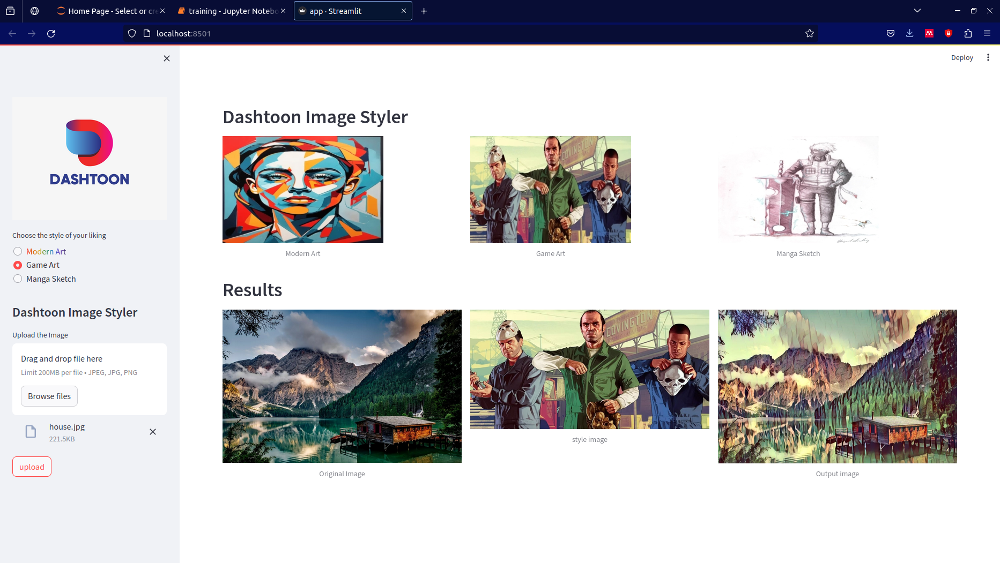

In [143]:
Image(filename='streamlit-app_ui/ui_game_art.png') 

- after selecting manga sketch as the style image

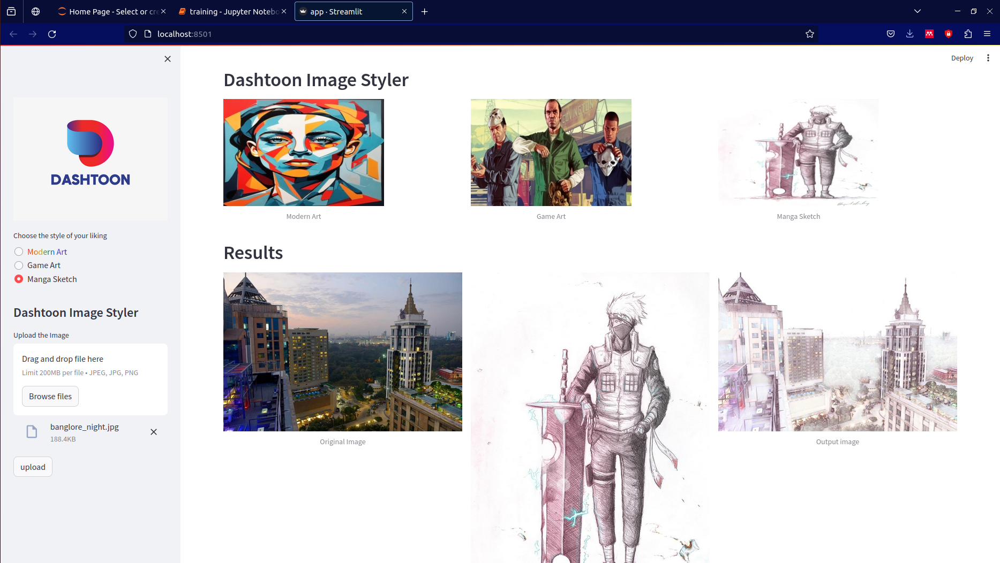

In [144]:
Image(filename='streamlit-app_ui/ui_sketch.png') 

##### Hardwware used for training
For the hardware I have used my department workstation PC which have the following specifications - 
- Processor - Intel i9-10900
- System Memmory - 32 GB
- Graphics Card - Nvidia RTX A4000
- Graphics Memory - 16 GB

## Approachs
Neural Style Transfer have basically 2 approaches as below, for this assignment I chose to go with Fast Neural Style transfer, which is relatively faster than the other and gives really appealing reaults.

### 1) Optimization Approach (Based on Leon Gatys et al. paper)
https://ieeexplore.ieee.org/document/7780634
- Feature Extraction:
    - A pre-trained neural network withtout the outp extract content features from one image and style features from another.(usually middle layers of VGG-13 or VGG-16 is used for this purpose.

- Gram Matrix:
    - Represent style by analyzing correlations between feature maps using Gram matrices. This gram matrices will be later used to find style loss.
- Loss: it is a combination of Content Loss and Style Loss.

    - Content Loss
        - Measures the difference between the content features of the generated image and the content image.
    - Style Loss
        - Measures the difference between the style features of the generated image and the style image.
- Optimization:
    - Iteratively adjust pixel values in a generated image to minimize differences in content and style, creating a merged artistic result.
    
    
#### disadvantages
it is not appropriate for real time application as the whole iterative process will run for a new image.

### 2) Fast Neural Style Transfer (Based on Johnson et al. paper)
- https://doi.org/10.48550/arXiv.1603.08155

It requires 2 networks
- Pretrained Network (VGG13 or VGG16 etc.)
    - This netowrk helps in extracting features of the image. It compares content and style of 2 images. 
- Transfer Network
    - The quality of the stylized image is defined by a custom loss function that has terms for both content and style. The extracted content features of the stylized image are compared to the original content image, while the extracted style features are compared to those from the reference style image(s)


### Dataset used for training
The dataset used is ADE20k Dataset which contains 20000 images of indoor scenes as training set and 2000 images in validation set.The Dataset can be downloaded from [here](http://sceneparsing.csail.mit.edu/)

In [145]:
!wget -P dataset/ "http://data.csail.mit.edu/places/ADEchallenge/ADEChallengeData2016.zip"

--2023-11-19 17:13:03--  http://data.csail.mit.edu/places/ADEchallenge/ADEChallengeData2016.zip
Resolving data.csail.mit.edu (data.csail.mit.edu)... 128.52.131.233
Connecting to data.csail.mit.edu (data.csail.mit.edu)|128.52.131.233|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://data.csail.mit.edu/places/ADEchallenge/ADEChallengeData2016.zip [following]
--2023-11-19 17:13:04--  https://data.csail.mit.edu/places/ADEchallenge/ADEChallengeData2016.zip
Connecting to data.csail.mit.edu (data.csail.mit.edu)|128.52.131.233|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 967382037 (923M) [application/zip]
Saving to: ‘dataset/ADEChallengeData2016.zip’

ADEChallengeData201 100%[===================>] 922.57M   264KB/s    in 47m 17s 

2023-11-19 18:00:24 (333 KB/s) - ‘dataset/ADEChallengeData2016.zip’ saved [967382037/967382037]



In [147]:
!unzip dataset/ADEChallengeData2016.zip -d dataset/

Archive:  dataset/ADEChallengeData2016.zip
   creating: dataset/ADEChallengeData2016/
  inflating: dataset/ADEChallengeData2016/sceneCategories.txt  
  inflating: dataset/ADEChallengeData2016/objectInfo150.txt  
   creating: dataset/ADEChallengeData2016/images/
   creating: dataset/ADEChallengeData2016/images/training/
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007812.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007460.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015667.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010139.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019600.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002499.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006220.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014780.jpg  
  inflating: da

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003381.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011621.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001712.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013967.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013515.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000152.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012880.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012355.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017879.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003047.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006719.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011995.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004327.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008340.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016687.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004480.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016120.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008895.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009500.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009972.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012799.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005915.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005567.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000239.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013721.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001526.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001954.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004278.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013086.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013218.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008081.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016934.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016546.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004741.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008726.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017306.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003118.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006646.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018381.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009093.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017554.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017926.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005753.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009734.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016314.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013838.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008174.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004113.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019675.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015612.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018792.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006255.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003979.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014052.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006980.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018035.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009327.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005340.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017147.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009480.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012790.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009509.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020087.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000934.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000546.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005218.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012741.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020056.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004458.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001306.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008398.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013101.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004887.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005512.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005960.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009907.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009575.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000999.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017715.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003359.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006875.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006407.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018667.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014600.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016941.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004093.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016294.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008753.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004734.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017373.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005174.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009113.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003098.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018201.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011538.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014266.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016865.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016417.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005050.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017982.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009037.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009790.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017257.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012509.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006145.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018482.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014897.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018325.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000031.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009708.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012591.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013476.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013804.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016328.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004688.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008148.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001671.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010911.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010563.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002764.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008223.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007884.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019131.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015156.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010608.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019696.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007351.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011048.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014716.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018771.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006963.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006511.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016044.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008583.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009464.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009816.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005871.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005403.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017604.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000888.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006516.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006964.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003248.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014711.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012002.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002131.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010491.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002696.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010336.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015468.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003771.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014228.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011904.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011576.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006788.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000664.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014635.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006395.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018652.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014192.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006840.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006432.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019012.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015075.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007272.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009686.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017341.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017894.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007904.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007576.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002228.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010788.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016664.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004463.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004811.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008876.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008404.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017024.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009991.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005584.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004935.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004547.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008520.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008952.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016740.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008287.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009360.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005307.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000459.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020149.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017100.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009659.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004121.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016481.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008146.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017914.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017566.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012238.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000798.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009706.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005761.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019635.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015652.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019192.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012244.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011884.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006608.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003156.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011351.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018468.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002716.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007048.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019228.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010963.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010511.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012182.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019819.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010887.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002155.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011960.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011512.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003715.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014999.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003063.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011264.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014948.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002623.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010383.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010489.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007677.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002129.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015470.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015802.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019865.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019417.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003769.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018982.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006037.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014597.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006790.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014368.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011436.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011844.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015016.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010748.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019071.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007211.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018631.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011108.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014656.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006451.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006823.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000723.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012283.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003191.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018308.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011843.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011431.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003636.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006168.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011396.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010271.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019548.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015288.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017667.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012139.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016780.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008247.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004220.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013779.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008992.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016027.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004587.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006114.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018374.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014313.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015140.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002419.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007347.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019680.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004987.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008592.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016055.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004252.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008235.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017615.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000899.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009807.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011754.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003553.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003921.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020156.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012641.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005318.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000834.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000446.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013001.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008298.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001206.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004558.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019772.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002775.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010572.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010900.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003135.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011495.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018879.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003692.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011332.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000020.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009719.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012580.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012762.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000917.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000565.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017505.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017977.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005702.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009765.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013869.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016345.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008682.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008125.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016890.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007630.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015437.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015845.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010369.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007197.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019822.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019450.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008742.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016285.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004725.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016950.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016522.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000696.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001771.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008048.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004788.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016228.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013576.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013904.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008099.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013200.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004759.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001007.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012440.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011583.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003023.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010464.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010816.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002663.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019888.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013903.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013571.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001776.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004028.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016588.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012331.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005275.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017072.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004847.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004435.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016195.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008452.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008820.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004392.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016632.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007520.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007952.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015080.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018439.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007019.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002747.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019279.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010932.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010540.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001652.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013455.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013827.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000012.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012215.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017939.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010532.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002092.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010295.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002735.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018839.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011372.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003175.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005099.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012267.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017539.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000060.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009759.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006236.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003568.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014796.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018056.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006591.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014031.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010688.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002328.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007804.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007476.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015671.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019616.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005483.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009896.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017123.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000808.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005324.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017684.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009343.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016763.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008503.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008971.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004916.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004564.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016408.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001151.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013883.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008668.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019908.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010243.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002044.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010996.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011403.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011871.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014888.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003604.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004541.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004933.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008281.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016746.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013018.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007826.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007454.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019193.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015653.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019634.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003938.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006214.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000423.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012183.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013064.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008928.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001263.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016203.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008063.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004004.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017443.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017831.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009184.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005644.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019589.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002710.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015249.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010517.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010965.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003150.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011882.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011357.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014409.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000045.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012997.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012242.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007325.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015685.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019145.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007482.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015122.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006565.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006917.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014762.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018705.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009417.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009865.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020199.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013250.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005149.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000617.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009689.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012410.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012862.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003702.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011977.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011505.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002142.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010890.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010345.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011116.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014648.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003311.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018188.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015008.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010756.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002551.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002923.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012462.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012810.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000665.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013222.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007505.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014142.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018125.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006890.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003869.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006345.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018682.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006841.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006433.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014193.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018653.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006394.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017431.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017843.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005191.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004076.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001728.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008011.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013288.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016271.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007163.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019303.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015364.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010848.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011428.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015291.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007731.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010268.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015536.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015944.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007096.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019923.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019551.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008643.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016384.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004624.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013023.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001583.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013784.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004908.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001224.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012663.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020174.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009888.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000816.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000464.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010925.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010557.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018576.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018904.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014963.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014511.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003048.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006716.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008913.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008561.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004506.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004974.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001258.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016701.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009279.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020050.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017019.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012747.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002674.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010473.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010801.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003034.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011594.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003793.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018978.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011233.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012825.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001010.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008729.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013217.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016549.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002105.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019849.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010302.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003745.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011930.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011542.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001803.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001555.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001927.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012112.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005839.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000315.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014759.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011007.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018099.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003200.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010647.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015119.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002832.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005058.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012973.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012501.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009798.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003613.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011414.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011866.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010981.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002053.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015978.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010254.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005439.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015661.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009735.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005752.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017555.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017927.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009092.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004112.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008175.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016315.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013839.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007007.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002759.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019601.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002498.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015666.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010138.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007813.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007461.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011778.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014026.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018041.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006586.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014781.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006221.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019338.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010401.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010873.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007158.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002606.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013966.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013514.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001713.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012354.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017878.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012881.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000153.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016657.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007545.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007937.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019082.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019725.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015742.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006305.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003829.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014102.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018165.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004031.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008056.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006546.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006934.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015101.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019166.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007306.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002458.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007470.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007802.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019610.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002489.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015677.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010129.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014889.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011402.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011870.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000710.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009029.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017249.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020200.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012965.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012517.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013882.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008669.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001150.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016690.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004330.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015022.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007582.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019045.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015785.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007225.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002909.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018605.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014662.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006465.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006817.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019039.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003347.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006419.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003892.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018679.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011140.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000252.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009919.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000987.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012055.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001412.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001860.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001001.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008738.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011132.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003492.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011695.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003335.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006819.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010772.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002907.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002575.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004499.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016139.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014166.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006361.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017073.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000958.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005274.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009213.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016633.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004393.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008453.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008821.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016194.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004846.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007018.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002746.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006366.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003438.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011198.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018106.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014161.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015086.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002278.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007954.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007526.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015721.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010127.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002487.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000014.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012213.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001654.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013821.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013453.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002741.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010546.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010934.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015218.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018398.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001249.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005882.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017150.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020119.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009497.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000409.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005357.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009330.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010948.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015264.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019203.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007063.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003134.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016759.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013007.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001200.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008539.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012647.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017119.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020150.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009379.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000440.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000832.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011752.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015630.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004950.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004522.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008545.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008937.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016082.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004285.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016725.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009305.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005362.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017165.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017613.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016896.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008123.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017971.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017503.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012988.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009763.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005704.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007397.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019650.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010169.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015637.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007842.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019774.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015713.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003878.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018693.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006354.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014153.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006881.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018134.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009226.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005241.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012718.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017046.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003019.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009192.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017455.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017827.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005652.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009635.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013939.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016215.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008075.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004012.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006481.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018146.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010385.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002625.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010422.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010850.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002182.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003065.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018929.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011262.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008468.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001351.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016608.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013156.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011513.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009138.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000601.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012406.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012874.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017358.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001041.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008778.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013993.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016518.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013246.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013530.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006112.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014315.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011839.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018372.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016105.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004302.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008365.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017745.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009282.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009957.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009525.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005542.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006279.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011087.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003280.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018019.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011720.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011056.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014708.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003984.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003251.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015148.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010616.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019688.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001947.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013095.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012172.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000375.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005859.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011067.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014739.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006299.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003260.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002387.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015179.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010627.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008749.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004089.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016529.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013277.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002165.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019829.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010362.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011285.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003725.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011950.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011522.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003082.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007959.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002275.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010072.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008459.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001360.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016639.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013167.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004399.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000520.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000952.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012080.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009219.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005481.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009894.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020168.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017121.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006233.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014793.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018053.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006594.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014034.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007801.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007473.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015674.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011873.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011401.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018338.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007718.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002046.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010994.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019578.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010241.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015269.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010945.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010537.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002097.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016952.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004080.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008740.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016287.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001079.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004727.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013747.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016019.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008279.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001932.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001540.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017659.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012442.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001005.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013202.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002110.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019389.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010317.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015449.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003750.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014209.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011557.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011925.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006945.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001463.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010771.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019048.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015788.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002576.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002904.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007228.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018608.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003491.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011131.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006468.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003336.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004390.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016630.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001369.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004437.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004845.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016197.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008822.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008450.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017070.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020039.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009210.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012089.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018989.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011917.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011565.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002122.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010482.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002685.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015809.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010325.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005548.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000216.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009288.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012011.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011519.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014247.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018220.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014992.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018587.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006040.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019812.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019460.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015407.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015875.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010359.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007600.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002467.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015699.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011020.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003580.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018719.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011787.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003227.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006579.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002159.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007607.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019467.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019815.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003641.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011834.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011446.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014318.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001907.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001575.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013772.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008999.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020182.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012695.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005819.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000335.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011848.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014364.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018303.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006163.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017271.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012288.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009011.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000728.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005076.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004191.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016843.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016431.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019992.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007027.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002779.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015587.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014460.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014812.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018875.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018407.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011499.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003139.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006667.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006111.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013076.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016728.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009308.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012191.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000843.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000431.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020121.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017168.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012636.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000396.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002705.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015989.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017456.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009191.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009636.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005651.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014543.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014931.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018956.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018524.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018283.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006744.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019364.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015303.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006738.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011261.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018558.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007178.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002626.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010386.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019318.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002181.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010853.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010421.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001733.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013293.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000351.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009468.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012187.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000855.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000427.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005379.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012620.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020137.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000380.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004539.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001267.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016099.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007747.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019280.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015540.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015932.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019955.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019527.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006107.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003659.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018367.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014300.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008254.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016793.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002520.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010727.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015079.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002287.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013195.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001435.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001847.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013632.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001392.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005959.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000275.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012072.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012866.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000613.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010720.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019019.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002280.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010087.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007279.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002527.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002955.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018659.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011160.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003367.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017336.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012468.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006024.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018991.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014584.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018244.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006783.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014223.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007664.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015463.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015811.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019876.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002199.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019300.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008012.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004075.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016272.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005635.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017395.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009652.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005192.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017840.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017432.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009683.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008691.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016356.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013408.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016883.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008136.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004151.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012248.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017516.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017964.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005711.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009776.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012771.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015991.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007043.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019584.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010968.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015244.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019223.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006603.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018811.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018463.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014404.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014876.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005716.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000455.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011747.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014019.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003540.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003932.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015659.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010107.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019199.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002300.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000793.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012233.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000034.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019677.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015610.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007865.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007417.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002349.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001989.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016705.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004502.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004970.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008917.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008565.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017145.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008519.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013780.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001587.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016779.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013027.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009359.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000812.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000460.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012667.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020170.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017139.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005499.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004118.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001646.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012201.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009098.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000006.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005758.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011314.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014838.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003113.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010554.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010926.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002753.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017066.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000298.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009206.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005261.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004386.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016626.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013178.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004421.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004853.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008834.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008446.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016181.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015489.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019349.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010802.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010470.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000931.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000543.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012744.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020053.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001303.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008848.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013104.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007548.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012357.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000150.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009669.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012882.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013517.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013965.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016249.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008029.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001710.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010870.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010402.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015889.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015487.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002679.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007127.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019892.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015320.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019347.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007680.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006767.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003039.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011599.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018975.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018507.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004743.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008724.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008083.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016544.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016936.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007656.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019391.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002108.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019436.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019844.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015823.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015451.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015907.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007772.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014335.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011819.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018352.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006695.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014492.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006132.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018887.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011152.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003880.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006879.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018525.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014542.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014930.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007105.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015302.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019365.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008077.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004010.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016217.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013549.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005650.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009637.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018559.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011260.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003067.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006739.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014299.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010852.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010420.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019319.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002180.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010387.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007179.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002627.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014158.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002241.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015718.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010046.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002994.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000175.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012372.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013295.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001735.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013940.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013532.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001092.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006455.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006827.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014652.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018635.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006484.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018143.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014124.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006323.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014683.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015764.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019703.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007563.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016175.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008315.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004372.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005295.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017735.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005940.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005532.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009555.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009927.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017092.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006380.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018647.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010323.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002683.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019868.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003764.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011563.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011911.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000671.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009148.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005688.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017328.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012804.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012476.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009803.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009471.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017611.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006971.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006503.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018763.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003988.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014704.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019684.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007343.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015144.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007896.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012529.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005070.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009017.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018305.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014362.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006165.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015950.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015522.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019545.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019937.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007082.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015285.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001664.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007788.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010576.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010904.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015228.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002771.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014468.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011336.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003696.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011491.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003131.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006119.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016870.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017997.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009022.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005045.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009785.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017242.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014882.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006150.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018497.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014357.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011409.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018330.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011014.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003213.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012101.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009398.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000306.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005458.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013741.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004218.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001546.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001934.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011475.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011807.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007194.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015846.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015434.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006073.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014274.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011958.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018213.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006938.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003214.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011013.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002454.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002826.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009444.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017183.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005423.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005851.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014731.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006291.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018756.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014096.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006944.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006536.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003268.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019116.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012108.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008276.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004211.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013748.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016016.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002828.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007304.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015103.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019164.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018083.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006936.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006544.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018600.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011139.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014667.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006460.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006812.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008094.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016553.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016921.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008733.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004754.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017313.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005114.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006815.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006467.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003339.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011699.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018607.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014660.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015787.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002579.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007227.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015020.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007580.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019047.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000985.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017709.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012057.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000250.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009569.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010363.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019828.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002164.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003083.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011951.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011523.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003724.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005898.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001253.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008918.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001986.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013054.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013722.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001282.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013085.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001957.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001525.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012162.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000365.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013028.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004571.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004903.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008964.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008516.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019604.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015663.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007816.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007464.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014023.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018044.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006583.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013788.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008511.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008963.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016771.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017696.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009351.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005336.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000468.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009884.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020178.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017131.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005491.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013840.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013432.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001635.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013395.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014058.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011706.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018798.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003973.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003501.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002894.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010146.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015618.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000007.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005759.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012200.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009099.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010693.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002333.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010134.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002494.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003901.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003573.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011774.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005338.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017522.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017950.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005725.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009742.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017285.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006197.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018450.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018822.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011369.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014845.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014437.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006630.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006309.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012745.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020052.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000930.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000542.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013105.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008849.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001302.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005722.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009745.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017282.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005085.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013563.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003822.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003450.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014109.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011657.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002210.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019089.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010017.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015749.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001305.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004829.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013102.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001379.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004855.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004427.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017060.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020029.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005267.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000539.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009200.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012099.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018112.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014175.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006372.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011575.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011907.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010492.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002132.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015819.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010335.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002695.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005558.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000206.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00009298.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012001.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001446.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018597.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006050.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014982.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015865.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015417.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010349.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019470.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019802.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007610.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016502.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00016970.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008762.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006086.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018933.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018541.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014281.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006721.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002198.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019301.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010438.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015366.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007161.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002149.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007617.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010025.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003462.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00003810.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011665.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017789.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000905.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000577.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005229.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012770.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020067.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004469.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001337.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015709.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010057.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002985.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002250.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00013142.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001890.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004869.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001345.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00012702.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00020015.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000977.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000505.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00017020.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006332.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014692.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018152.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006495.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014135.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007900.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007572.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015775.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019712.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00005646.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00000118.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00001499.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008407.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00008875.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004812.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00004460.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015772.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019715.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007575.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007907.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00018155.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00006492.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014132.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00014805.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00011329.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015590.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019985.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007030.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010569.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00015237.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007797.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00019250.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00002257.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00007509.jpg  
  inflating: dataset/ADEChallengeData2016/images/training/ADE_train_00010050.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000579.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001789.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000357.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000882.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001965.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001517.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001176.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000736.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000091.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000040.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001600.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001261.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000123.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000684.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000868.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000629.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001069.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001408.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000248.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000299.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000814.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000466.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001581.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001226.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000132.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000644.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001004.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001817.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001465.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000225.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000582.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000760.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001687.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001120.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001541.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001933.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001735.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001881.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001354.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000966.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000514.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000839.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001382.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001425.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001857.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000265.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000604.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001044.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001690.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000777.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000316.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001556.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001924.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001013.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000653.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000595.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000232.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001800.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001472.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001304.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001733.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000173.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000512.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000960.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001887.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001352.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001617.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000057.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000844.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000436.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000391.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001276.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000878.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000920.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000552.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001312.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001773.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000133.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000694.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000645.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001005.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001816.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001464.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000583.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001614.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001162.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000085.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000722.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000896.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000343.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001503.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001971.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001829.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000447.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000835.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001207.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000194.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000633.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000376.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001536.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001944.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001291.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001157.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000717.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000061.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001186.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001621.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001995.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000596.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000231.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000650.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001010.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001766.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000126.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000681.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000547.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000935.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001307.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001199.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001529.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001967.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000880.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000355.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000423.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000851.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000384.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001263.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001602.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000042.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000975.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000507.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001892.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001979.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001795.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001032.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000672.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000213.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001453.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001821.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001325.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001482.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000565.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000917.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000104.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001346.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001893.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001727.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001080.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000167.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000611.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001051.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001397.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001842.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001430.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000270.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000749.jpg  
  in

  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000462.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001222.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001585.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001926.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001554.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000314.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000775.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001692.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001135.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001470.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00001802.jpg  
  inflating: dataset/ADEChallengeData2016/images/validation/ADE_val_00000230.jpg  
  in

  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00001789.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00000118.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00001758.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00001339.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00000579.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00001919.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00000273.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00001433.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00001841.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00001394.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00001052.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00001269.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00000429.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00000099.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00000207.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00001835.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00001447.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00001781.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00001026.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00000666.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00000110.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00001750.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00001172.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00000732.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00000095.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00000353.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00000886.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00001961.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00001513.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00001839.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00000422.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00000850.png  
  inflating: dataset/ADEChallengeData2016/annotations/validation/ADE_val_00000385.png  
  inflating: dataset/ADEChalleng

   creating: dataset/ADEChallengeData2016/annotations/training/
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00013730.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00001290.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00013097.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00004269.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00001945.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00001537.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00012170.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00000377.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00005429.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00017189.png  
  inflating: dataset/ADEChallengeData2016/annotations/tr

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00009606.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00005661.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00004786.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00013578.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00016226.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00004021.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00008046.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00016581.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00007693.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00019354.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00015333.png  
 extracting: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00020163.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00000801.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00000473.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00017413.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00017861.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00005614.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00012898.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00009673.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00016253.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00008794.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00008033.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00015147.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00019120.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00007895.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00007340.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00019687.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00008595.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00016052.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00004980.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00008232.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00001979.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00004255.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00009875.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00020189.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00009407.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00005460.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00005812.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00012872.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00012400.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00009699.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00000607.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00005159.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00013240.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00014640.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00018627.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011380.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003620.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011855.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011427.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00014379.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003187.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00002060.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00007099.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00015539.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011820.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00002015.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00010212.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00019959.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00008639.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00001100.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00013307.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00016459.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00000740.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00009079.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00017219.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00010013.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003826.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003454.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011653.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006633.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00014393.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00018821.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00018453.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006194.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00014434.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00014846.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00010980.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00002052.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00010255.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00015979.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003612.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011415.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011867.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00005059.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00000707.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00009799.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00012972.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00001119.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00017200.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00000759.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00005007.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00009060.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00018372.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011839.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00014315.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006112.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00015927.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00015555.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00002547.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00002935.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00019079.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00010740.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00001820.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00001452.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00013655.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00009959.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00000212.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00012015.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00012763.png  
  inflating: dataset/ADEChalleng

 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011760.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00018059.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00007479.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00002327.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00010687.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00019619.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00002480.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00010120.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00007140.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00019487.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00015892.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00012724.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00020033.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00000951.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00000523.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00012083.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003391.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00018108.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011631.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003436.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003844.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006368.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00012723.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00001364.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00004848.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00013163.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00002271.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00010076.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00015728.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00007288.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003843.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003431.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011191.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00007233.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00015793.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00019053.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00007594.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00015034.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006473.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006801.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00014674.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00018613.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00012798.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00009501.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00002916.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003483.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011123.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006808.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003324.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011684.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00016549.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00013217.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00008729.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00001010.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00012457.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003235.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006919.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003931.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003543.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011744.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00002303.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00010104.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00004548.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00001216.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00008288.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00013011.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011096.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006268.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003536.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003944.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011731.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00018008.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003291.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00002376.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00007428.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00015188.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00019648.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00013890.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00001142.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00013345.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00016869.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003276.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006528.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00014088.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00018748.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011071.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00010196.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00007368.png  
 extracting: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00015355.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00019332.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00015880.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00007152.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00019495.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00008787.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00016240.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00016995.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00008020.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00001719.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00004047.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006513.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006961.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00016420.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00016852.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00004180.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00016387.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00008640.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00001179.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00004627.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00017260.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00005067.png  
  inflating: dataset/ADEChalleng

 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011974.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00018598.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003701.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00010346.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00015418.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00002141.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00010893.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00013253.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00001054.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00013986.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00012861.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003633.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011846.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011434.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003194.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006454.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006826.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00018193.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00014653.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00018634.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00002938.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00007214.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00019001.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00002298.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00008313.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00004374.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00001858.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00016173.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00005534.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00005946.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00017094.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00009921.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00009553.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00015267.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00002099.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00019200.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006620.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00014380.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006187.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00018832.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00018440.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00014427.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00014855.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011379.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00018343.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011808.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00014324.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00018896.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006123.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00014483.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00015916.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00015564.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00019503.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00019971.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00007763.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00018700.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011039.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00014767.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006560.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006912.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00015127.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00010679.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00019140.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00007487.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00015680.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00007320.png  
 extracting: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00012938.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00017214.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00017910.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00017562.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00009702.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00005765.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00004682.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00016322.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00004125.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00008142.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00016485.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00000738.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00017261.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00017517.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00017965.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00012249.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00005710.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00009777.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00013409.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00016357.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00008690.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00008137.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00013496.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00004668.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00001136.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00015908.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00010224.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00002784.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00010583.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00002023.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011816.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011464.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003663.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00018749.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00014089.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003277.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006529.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00019109.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00002390.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00010630.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00007369.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00002845.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00002437.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00010197.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00010249.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00019570.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00019902.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00007710.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00018330.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011409.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00014357.png  
 extracting: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006150.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00018497.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00014882.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00016063.png  
 extracting: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00012645.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00020152.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00000830.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00000442.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00018069.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011750.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003557.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003925.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00006209.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00010110.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00019629.png  
  inflating: dataset/ADEChalleng

  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00017618.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00012146.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00008238.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00001501.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00001973.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00013706.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00016058.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003635.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011395.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00003192.png  
  inflating: dataset/ADEChallengeData2016/annotations/training/ADE_train_00011432.png  
 extracting: dataset/ADEChalleng

In [148]:
!rm dataset/ADEChallengeData2016.zip

### Importing the libraries

In [108]:
import torch
from torch.autograd import Variable
from collections import namedtuple
from torchvision import models
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
import numpy as np
import os
import sys
import random
from PIL import Image
import glob
from torch.optim import Adam, LBFGS
from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision.datasets import DatasetFolder
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import cv2
from IPython import display

fixing a seed for reproducible result

In [4]:
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True
    
seed_everything(42) 

Checking GPU name and defining device to 'cpu' or 'gpu'

In [5]:
print("GPU is -----", torch.cuda.get_device_name())
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

GPU is ----- NVIDIA RTX A4000


/home/nano-tech/mambaforge/envs/nst/lib/python3.10/site-packages/torch/cuda/__init__.py:611: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


#### Defining the constants 
- source for VGG16 training stats - https://pytorch.org/vision/main/models/generated/torchvision.models.vgg16.html

In [7]:
# mean and std used during IMAGENET competition
MEAN = np.array([0.485, 0.456, 0.406])
STD = np.array([0.229, 0.224, 0.225])

IMAGE_SIZE = 256
STYLE_SIZE = 448
LAMBDA_STYLE = 10e7
LAMBDA_CONTENT = 10e2

EPOCHS = 1 #it can be changed while calling the training function
LEARNING_RATE = 1e-5
BATCH_SIZE = 8

CHECKPOINT_INTERVAL = 500
SAMPLE_INTERVAL = 500

## Definfing the model architectures

In [8]:
# Pretrained VGG16 Model
class VGG16(torch.nn.Module):
    def __init__(self, requires_grad=False):
        super(VGG16, self).__init__()
        vgg_pretrained_features = models.vgg16(pretrained=True).features
        self.slice1 = torch.nn.Sequential()
        self.slice2 = torch.nn.Sequential()
        self.slice3 = torch.nn.Sequential()
        self.slice4 = torch.nn.Sequential()
        
        
        for x in range(4):
            self.slice1.add_module(str(x), vgg_pretrained_features[x])
        for x in range(4, 9):
            self.slice2.add_module(str(x), vgg_pretrained_features[x])
        for x in range(9, 16):
            self.slice3.add_module(str(x), vgg_pretrained_features[x])
        for x in range(16, 23):
            self.slice4.add_module(str(x), vgg_pretrained_features[x])
        if not requires_grad:
            for param in self.parameters():
                param.requires_grad = False

    def forward(self, X):
        h = self.slice1(X)
        h_relu1_2 = h
        h = self.slice2(h)
        h_relu2_2 = h
        h = self.slice3(h)
        h_relu3_3 = h
        h = self.slice4(h)
        h_relu4_3 = h
        vgg_outputs = namedtuple("VggOutputs", ["relu1_2", "relu2_2", "relu3_3", "relu4_3"])
        out = vgg_outputs(h_relu1_2, h_relu2_2, h_relu3_3, h_relu4_3)
        return out

### Transformer Net (from Johnson et. al)

In [9]:
#Transformer Net 
class TransformerNet(torch.nn.Module):
    def __init__(self):
        super(TransformerNet, self).__init__()
        self.model = nn.Sequential(
            ConvBlock(3, 32, kernel_size=9, stride=1),
            ConvBlock(32, 64, kernel_size=3, stride=2),
            ConvBlock(64, 128, kernel_size=3, stride=2),
            ResidualBlock(128),
            ResidualBlock(128),
            ResidualBlock(128),
            ResidualBlock(128),
            ResidualBlock(128),
            ConvBlock(128, 64, kernel_size=3, upsample=True),
            ConvBlock(64, 32, kernel_size=3, upsample=True),
            ConvBlock(32, 3, kernel_size=9, stride=1, normalize=False, relu=False),
        )

    def forward(self, x):
        return self.model(x)

#### Components of Transformer Net

In [10]:
# Residual Block
class ResidualBlock(torch.nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            ConvBlock(channels, channels, kernel_size=3, stride=1, normalize=True, relu=True),
            ConvBlock(channels, channels, kernel_size=3, stride=1, normalize=True, relu=False),
        )

    def forward(self, x):
        return self.block(x) + x


# Convolution Block
class ConvBlock(torch.nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1, upsample=False, normalize=True, relu=True):
        super(ConvBlock, self).__init__()
        self.upsample = upsample
        self.block = nn.Sequential(
            nn.ReflectionPad2d(kernel_size // 2), nn.Conv2d(in_channels, out_channels, kernel_size, stride)
        )
        self.norm = nn.InstanceNorm2d(out_channels, affine=True) if normalize else None
        self.relu = relu

    def forward(self, x):
        if self.upsample:
            x = F.interpolate(x, scale_factor=2)
        x = self.block(x)
        if self.norm is not None:
            x = self.norm(x)
        if self.relu:
            x = F.relu(x)
        return x


### functions for transforming the image

In [11]:
def train_transform(image_size):
    """ Transforms for training images """
    transform = transforms.Compose(
        [
            transforms.Resize((int(image_size * 1.15),int(image_size * 1.15))),
            transforms.RandomCrop(image_size),
            transforms.ToTensor(),
            transforms.Normalize(MEAN, STD),
        ]
    )
    return transform


def style_transform(image_size=None):
    """ Transforms for style image """
    resize = [transforms.Resize((image_size,image_size))] if image_size else []
    transform = transforms.Compose(resize + [transforms.ToTensor(), transforms.Normalize(MEAN, STD)])
    return transform


def test_transform(image_size=None):
    """ Transforms for test image """
    resize = [transforms.Resize(image_size)] if image_size else []
    transform = transforms.Compose(resize + [transforms.ToTensor(), transforms.Normalize(MEAN, STD)])
    return transform


#### Utility functions

In [29]:
def gram_matrix(y):
    """ Returns the gram matrix of y (used to compute style loss) """
    (b, c, h, w) = y.size()
    features = y.view(b, c, w * h)
    features_t = features.transpose(1, 2)
    gram = features.bmm(features_t) / (c * h * w)
    return gram


def denormalize(tensors):
    ''' this function Denormalizes image tensors using MEAN and STD '''
    for c in range(3):
        tensors[:, c].mul_(STD[c]).add_(MEAN[c])
    return tensors


def deprocess(image_tensor):
    '''this function Denormalizes and rescales image tensor'''
    image_tensor = denormalize(image_tensor)[0]
    image_tensor *= 255
    image_np = torch.clamp(image_tensor, 0, 255).cpu().numpy().astype(np.uint8)
    image_np = image_np.transpose(1, 2, 0)
    return image_np


### Function for training 

In [30]:
def fast_trainer(style_image,    
                 style_name,     
                 dataset_path,   
                 image_size = IMAGE_SIZE,
                 style_size = STYLE_SIZE,
                 batch_size = BATCH_SIZE,
                 lr = LEARNING_RATE,
                 epochs = EPOCHS,
                 checkpoint_model = None,
                 checkpoint_interval = CHECKPOINT_INTERVAL,
                 sample_interval = SAMPLE_INTERVAL,
                 lambda_style = LAMBDA_STYLE,
                 lambda_content = LAMBDA_CONTENT,):
    
    os.makedirs(f"./images/outputs/{style_name}-training", exist_ok=True)
    os.makedirs(f"./checkpoints", exist_ok=True)


    # Create dataloader for the training data, I have placed the images inside a dummy folder as datasets.ImageFolder takes label from the root which we don't need for this task
    train_dataset = datasets.ImageFolder(dataset_path, train_transform(image_size))
    dataloader = DataLoader(train_dataset, batch_size=batch_size)

    # Networks are defined
    transformer = TransformerNet().to(device)
    vgg = VGG16(requires_grad=False).to(device)

    # Load checkpoint model if specified 
    if checkpoint_model:
        transformer.load_state_dict(torch.load(checkpoint_model))

    # Define optimizer and loss 
    optimizer = Adam(transformer.parameters(), lr)
    l2_loss = torch.nn.MSELoss().to(device)

    # Load style image 
    style = style_transform(style_size)(Image.open(style_image))
    style = style.repeat(batch_size, 1, 1, 1).to(device)

    # Extract style features 
    features_style = vgg(style)
    gram_style = [gram_matrix(y) for y in features_style]

    # Sampling 8 images for visual evaluation of the model
    image_samples = []
    for path in random.sample(glob.glob(f"{dataset_path}/*/*.jpg"), 8):
        image_samples += [style_transform(image_size)(Image.open(path))]
    image_samples = torch.stack(image_samples)

    def save_sample(batches_done):
        # Evaluates the model and saves image samples
        transformer.eval()
        with torch.no_grad():
            output = transformer(image_samples.to(device))
        image_grid = denormalize(torch.cat((image_samples.cpu(), output.cpu()), 2))
        save_image(image_grid, f"./images/outputs/{style_name}-training/{batches_done}.jpg", nrow=4)
        transformer.train()
    
    
    train_metrics = {"content": [], "style": [], "total": []}
    for epoch in range(epochs):
        epoch_metrics = {"content": [], "style": [], "total": []}
        for batch_i, (images, _) in enumerate(dataloader):
            optimizer.zero_grad()

            images_original = images.to(device)
            images_transformed = transformer(images_original)

            # Extract features
            features_original = vgg(images_original)
            features_transformed = vgg(images_transformed)

            # Compute content loss as MSE between features
            content_loss = lambda_content * l2_loss(features_transformed.relu2_2, features_original.relu2_2)

            # Compute style loss as MSE between gram matrices
            style_loss = 0
            for ft_y, gm_s in zip(features_transformed, gram_style):
                gm_y = gram_matrix(ft_y)
                style_loss += l2_loss(gm_y, gm_s[: images.size(0), :, :])
            style_loss *= lambda_style

            total_loss = content_loss + style_loss
            total_loss.backward()
            optimizer.step()

            epoch_metrics["content"] += [content_loss.item()]
            epoch_metrics["style"] += [style_loss.item()]
            epoch_metrics["total"] += [total_loss.item()]
            
            train_metrics["content"] += [content_loss.item()]
            train_metrics["style"] += [style_loss.item()]
            train_metrics["total"] += [total_loss.item()]

            sys.stdout.write(
                "\r[Epoch %d/%d] [Batch %d/%d] [Content: %.2f (%.2f) Style: %.2f (%.2f) Total: %.2f (%.2f)]"
                % (
                    epoch + 1,
                    epochs,
                    batch_i,
                    len(train_dataset),
                    content_loss.item(),
                    np.mean(epoch_metrics["content"]),
                    style_loss.item(),
                   np.mean(epoch_metrics["style"]),
                    total_loss.item(),
                    np.mean(epoch_metrics["total"]),
                )
            )

            batches_done = epoch * len(dataloader) + batch_i + 1
            if batches_done % sample_interval == 0:
                save_sample(batches_done)

            if checkpoint_interval > 0 and batches_done % checkpoint_interval == 0:
                torch.save(transformer.state_dict(), f"./checkpoints/{style_name}_{batches_done}.pth")


            torch.save(transformer.state_dict(), f"./checkpoints/last_checkpoint.pth")
        
        # Print loss for each epoch in Notebook
        display.clear_output(wait=True)
        print(
            f'\nEpoch {epoch + 1}/{epochs}, '
            f'Training Loss: [Content: {np.mean(epoch_metrics["content"])} '
            f'Style: {np.mean(epoch_metrics["style"])} '
            f'Total: {np.mean(epoch_metrics["total"])}]'
        )
    print("Training Completed!")
    
    #printing the loss curve.
    plt.plot(train_metrics["content"], label = "Content Loss")
    plt.plot(train_metrics["style"], label = "Style Loss")
    plt.plot(train_metrics["total"], label = "Total Loss")
    plt.xlabel('Iteration')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.legend()
    plt.savefig("training_plot_latest.png")


#### Defining training dataset path and style image

In [40]:
STYLE_IMG = 'dataset/style/modern_art.jpg'
STYLE_NAME = 'modern_art'
DATASET_PATH = 'dataset/ADEChallengeData2016/images/'

In [41]:
os.listdir(DATASET_PATH)

['training', 'validation']

total number of images

In [45]:
print("images in training directory: ", len(os.listdir(DATASET_PATH + '/training')))
print("images in validation directory: ", len(os.listdir(DATASET_PATH + '/validation')))

images in training directory:  20210
images in validation directory:  2000


In [49]:
def plot_random_images(directory):
    # Get a list of image files in the directory
    image_files = [f for f in os.listdir(directory) if f.endswith(('.png', '.jpg', '.jpeg'))]

    # Randomly select 6 images
    selected_images = random.sample(image_files, 6)

    # Plot images in a 2x3 grid
    fig, axes = plt.subplots(2, 3, figsize=(10, 7))

    for i, ax in enumerate(axes.flatten()):
        img_path = os.path.join(directory, selected_images[i])
        img = plt.imread(img_path)
        ax.imshow(img)
        ax.axis('off')

    plt.show()

checking some random images from the training dataset

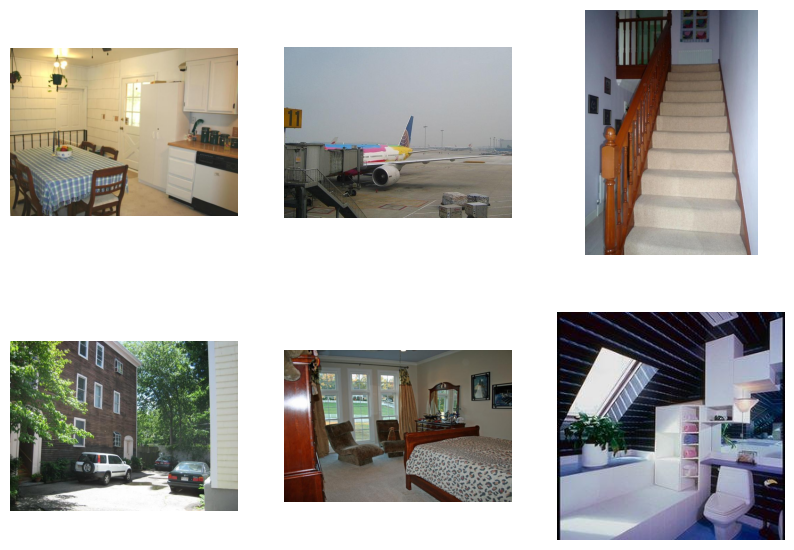

In [51]:
plot_random_images(DATASET_PATH + '/training')

checking the style image

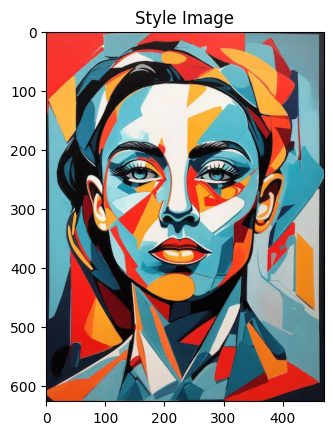

In [39]:
style_img = plt.imread(STYLE_IMG)
plt.imshow(style_img)
plt.title("Style Image")
plt.show()


Epoch 20/20, Training Loss: [Content: 10524.629284637198 Style: 3174.5739380366344 Total: 13699.203216431852]
Training Completed!


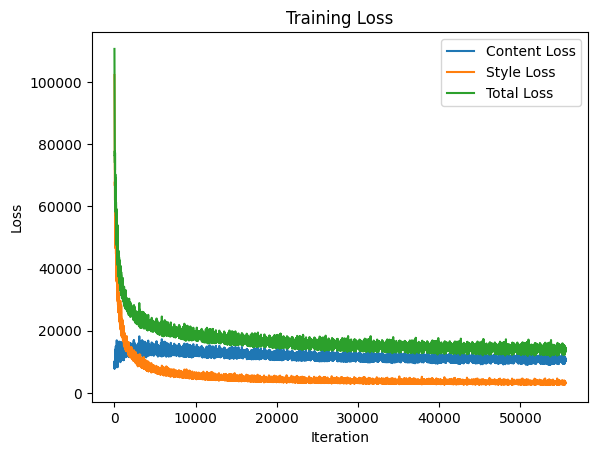

In [52]:
fast_trainer(style_image=STYLE_IMG, style_name = STYLE_NAME, dataset_path=DATASET_PATH, epochs = 20)

#### let's check the model's inference on the training data during training stage

#### inference during training

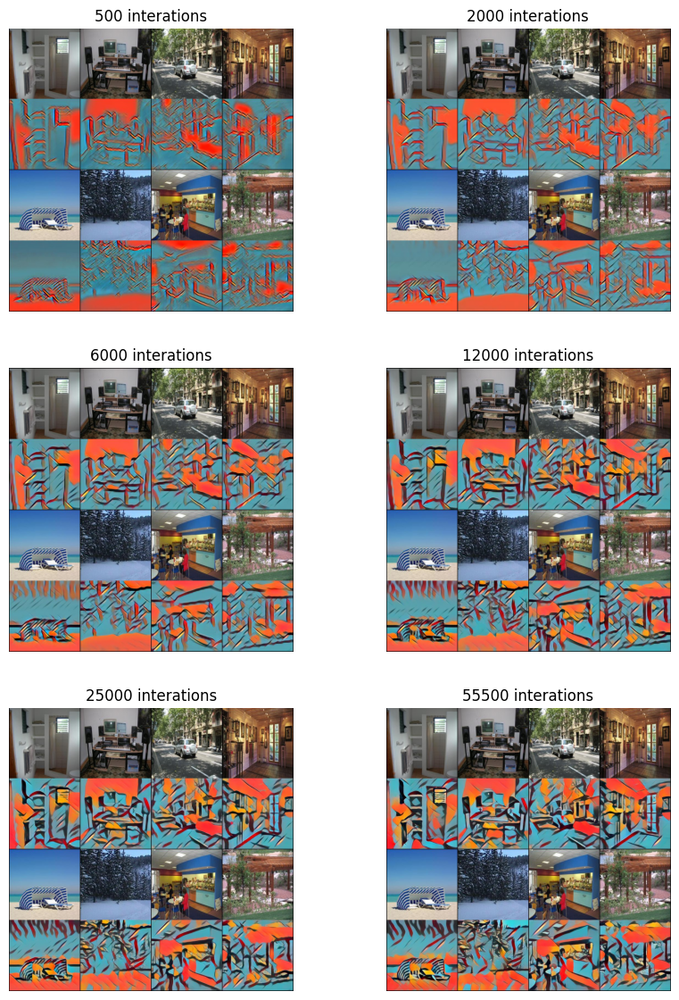

In [157]:
path = 'training_inferences/modern_art/'
paths = sorted(os.listdir(path), key = lambda x:int(x.split('.')[0]))

fig, axes = plt.subplots(3, 2, figsize=(10, 7*2))

for i, ax in enumerate(axes.flatten()):
    img_path = os.path.join(path, paths[i])
    img = plt.imread(img_path)
    ax.imshow(img)
    ax.title.set_text(f"{paths[i].split('.')[0]} interations" )
    ax.axis('off')

plt.show()


## Doing Inference on new image

In [136]:
def inference(image_path,checkpoint_model):
    os.makedirs("results", exist_ok=True)
    img_name = os.path.basename(image_path).split('.')[0]
    model_name = os.path.basename(checkpoint_model).split('.')[0]

    transform = test_transform()

    # Define model and load model checkpoint
    transformer = TransformerNet().to(device)
    transformer.load_state_dict(torch.load(checkpoint_model))
    transformer.eval()

    # Prepare input
    image_tensor = Variable(transform(Image.open(image_path))).to(device)
    image_tensor = image_tensor.unsqueeze(0)

    # Stylize image
    with torch.no_grad():
        stylized_image = denormalize(transformer(image_tensor)).cpu()
    
    # Save image
    output_path = f"results/{img_name}-{model_name}.jpg"
    save_image(stylized_image, output_path)
    print(f"Image Saved at {output_path}")
    return output_path
#     plt.imshow(cv2.cvtColor(cv2.imread(os.path.join(save_path,f"results/{fn}-output.jpg")), cv2.COLOR_BGR2RGB))


In [73]:
def plot_image_grid(list1, list2):
    assert len(list1) == len(list2), "Both lists must have the same length"
    n_rows = len(list1)
    fig, axes = plt.subplots(n_rows, 2, figsize=(10, 3 * n_rows))

    for i, ax in enumerate(axes.flatten()):
        if i & 1 == 0:
            index = i >> 1
            img_path = list1[index]
            img = plt.imread(img_path)
        else:
            index = i >> 1
            img_path = list2[index]
            img = plt.imread(img_path)
        ax.imshow(img)
        ax.axis('off')

    plt.show()
    

Image Saved at results/trees-output.jpg
Image Saved at results/Sushant-Singh-Rajput-output.jpg
Image Saved at results/tajmahal-output.jpg
Image Saved at results/banglore_night-output.jpg
Image Saved at results/kalam-output.jpg


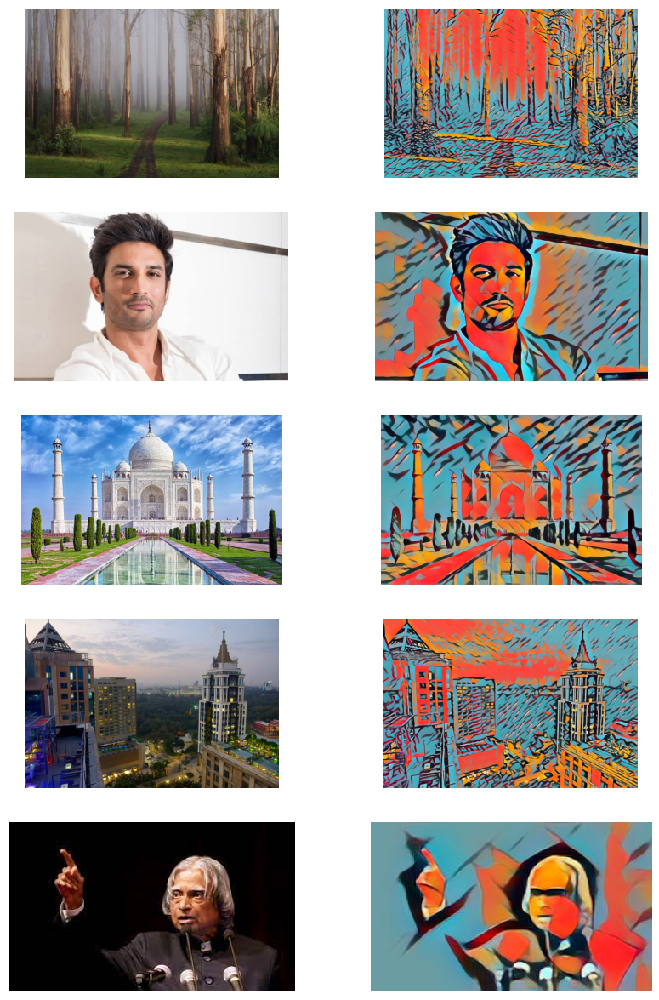

In [88]:
IMG_PATHS = ['original_images/trees.jpeg', 'original_images/Sushant-Singh-Rajput.jpg', 'original_images/tajmahal.jpg', 'original_images/banglore_night.jpg', 'original_images/kalam.jpeg']
MODEL_PATH = 'models/modern_art.pth'
styled_imgs = []
for img in IMG_PATHS:
    styled_imgs.append(inference(img, MODEL_PATH,img))
    
plot_image_grid(IMG_PATHS, styled_imgs)

- we can see that results are good for this model

### Style-2(manga_sketch)

In [92]:
STYLE_IMG = 'dataset/style/kakshi.jpg'
STYLE_NAME = 'manga_art'
DATASET_PATH = 'dataset/ADEChallengeData2016/images/'

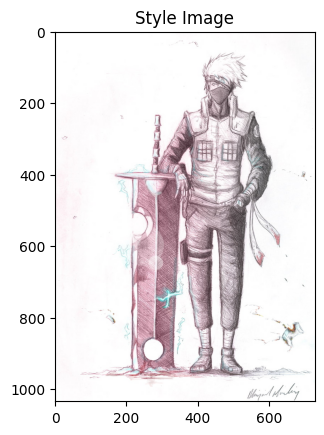

In [93]:
style_img = plt.imread(STYLE_IMG)
plt.imshow(style_img)
plt.title("Style Image")
plt.show()

In [98]:
LAMBDA_STYLE = 10e11
LAMBDA_CONTENT = 1


Epoch 40/40, Training Loss: [Content: 2064.7975561233316 Style: 808.6557943792621 Total: 2873.453349623441]
Training Completed!


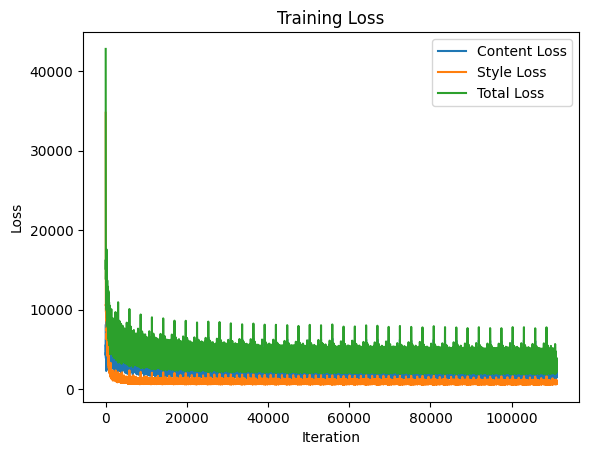

In [99]:
fast_trainer(style_image=STYLE_IMG, style_name = STYLE_NAME, dataset_path=DATASET_PATH, epochs = 40)

#### inference during training

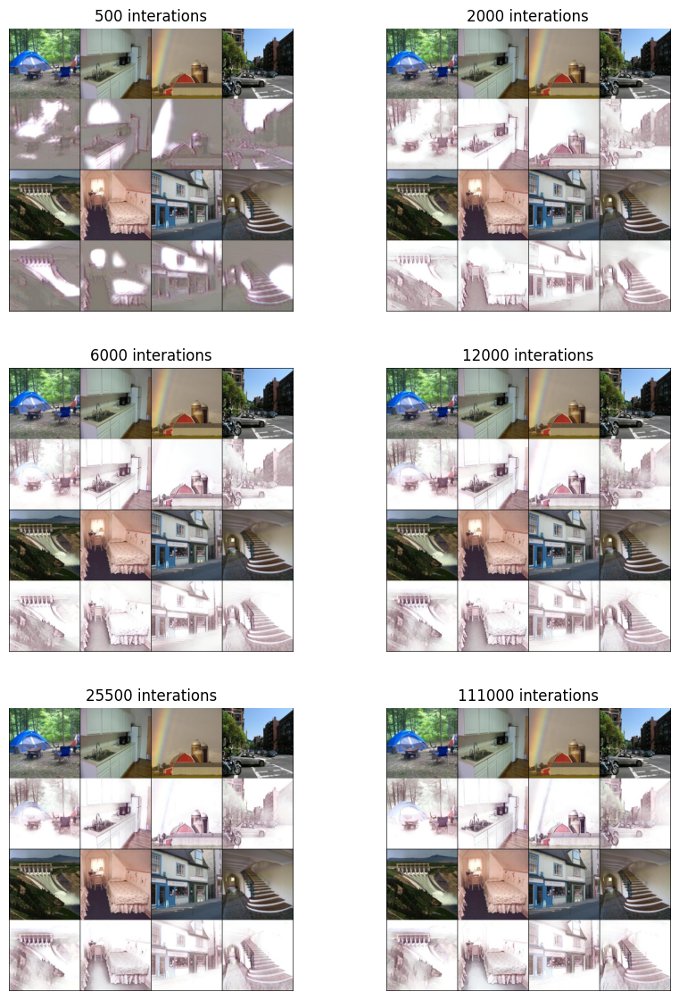

In [158]:
path = 'training_inferences/manga-art/'
paths = sorted(os.listdir(path), key = lambda x:int(x.split('.')[0]))

fig, axes = plt.subplots(3, 2, figsize=(10, 7*2))

for i, ax in enumerate(axes.flatten()):
    img_path = os.path.join(path, paths[i])
    img = plt.imread(img_path)
    ax.imshow(img)
    ax.title.set_text(f"{paths[i].split('.')[0]} interations" )
    ax.axis('off')

plt.show()

### inference on new images

Image Saved at results/trees-output.jpg
Image Saved at results/Sushant-Singh-Rajput-output.jpg
Image Saved at results/tajmahal-output.jpg
Image Saved at results/banglore_night-output.jpg
Image Saved at results/kalam-output.jpg


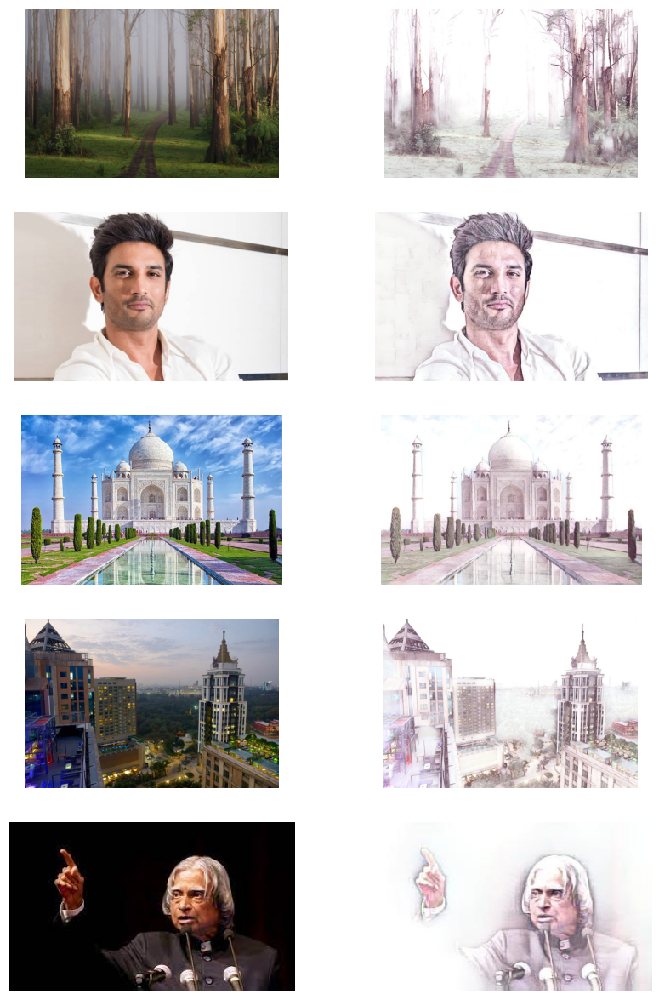

In [100]:
IMG_PATHS = ['original_images/trees.jpeg', 'original_images/Sushant-Singh-Rajput.jpg', 'original_images/tajmahal.jpg', 'original_images/banglore_night.jpg', 'original_images/kalam.jpeg']
MODEL_PATH = 'models/manga_sketch.pth'
styled_imgs = []
for img in IMG_PATHS:
    styled_imgs.append(inference(img, MODEL_PATH,img))
    
plot_image_grid(IMG_PATHS, styled_imgs)

- here we can see that although output images looks good, they are not as expected
- this can be due to the reason that the training dataset didn't containing images of people's face

### Style-3 (game-GTA)

In [131]:
STYLE_IMG = 'dataset/style/gta.jpg'
STYLE_NAME = 'game'
DATASET_PATH = 'dataset/ADEChallengeData2016/images/'

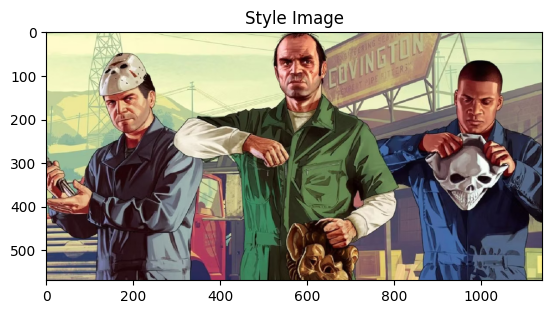

In [132]:
style_img = plt.imread(STYLE_IMG)
plt.imshow(style_img)
plt.title("Style Image")
plt.show()

In [133]:
LAMBDA_STYLE = 10e20
LAMBDA_CONTENT = 10e2

- after experimenting with many weight values, I trained the model with the above weights


Epoch 30/30, Training Loss: [Content: 3249.162975076381 Style: 1607.9224390202303 Total: 4857.085415107636]
Training Completed!


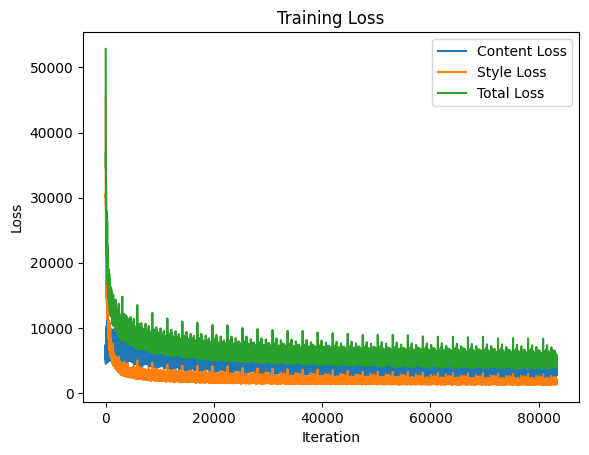

In [134]:
fast_trainer(style_image=STYLE_IMG, style_name = STYLE_NAME, dataset_path=DATASET_PATH, epochs = 30)

#### inference during training

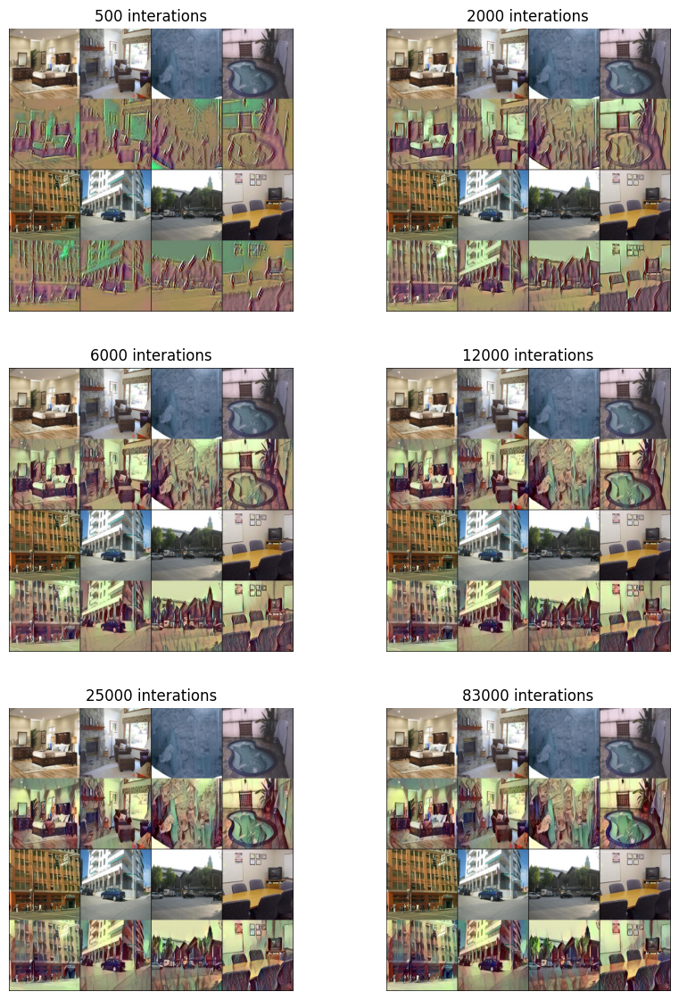

In [159]:
path = 'training_inferences/game-training/'
paths = sorted(os.listdir(path), key = lambda x:int(x.split('.')[0]))

fig, axes = plt.subplots(3, 2, figsize=(10, 7*2))

for i, ax in enumerate(axes.flatten()):
    img_path = os.path.join(path, paths[i])
    img = plt.imread(img_path)
    ax.imshow(img)
    ax.title.set_text(f"{paths[i].split('.')[0]} interations" )
    ax.axis('off')

plt.show()

#### inference on new images

Image Saved at results/trees-game.jpg
Image Saved at results/Sushant-Singh-Rajput-game.jpg
Image Saved at results/tajmahal-game.jpg
Image Saved at results/banglore_night-game.jpg
Image Saved at results/kalam-game.jpg


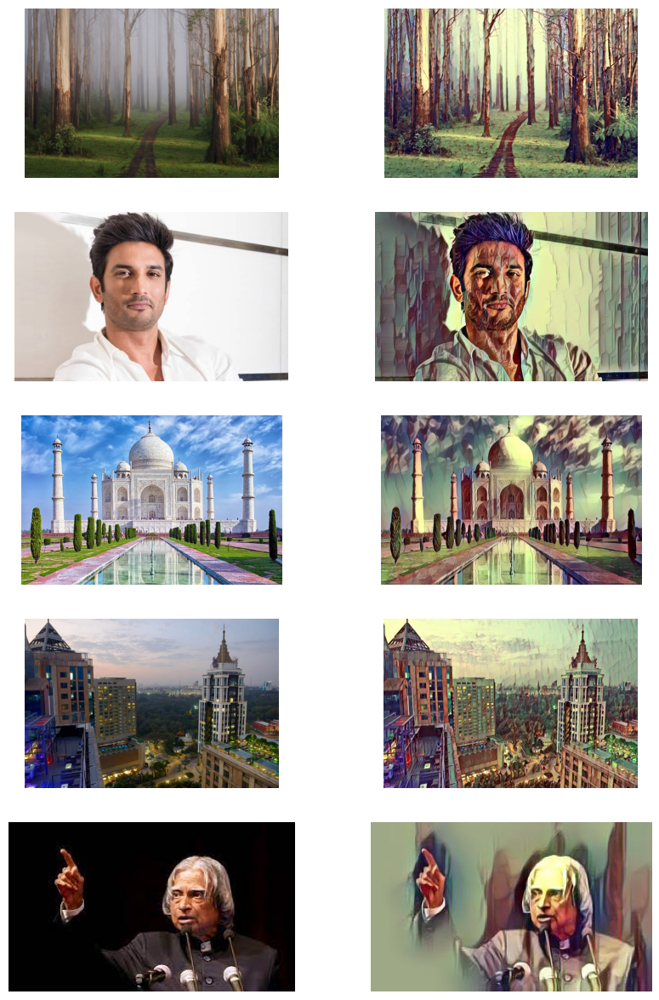

In [137]:
IMG_PATHS = ['original_images/trees.jpeg', 'original_images/Sushant-Singh-Rajput.jpg', 'original_images/tajmahal.jpg', 'original_images/banglore_night.jpg', 'original_images/kalam.jpeg']
MODEL_PATH = 'models/game.pth'
styled_imgs = []
for img in IMG_PATHS:
    styled_imgs.append(inference(img, MODEL_PATH))
    
plot_image_grid(IMG_PATHS, styled_imgs)

- we can see that it is not performing well on people's face and outdoor scenes
- as most of the training dataset was indoor scenes
- now let's try the model with some indoor scenes

Image Saved at results/washroom-game.jpg
Image Saved at results/interior-3-game.jpg


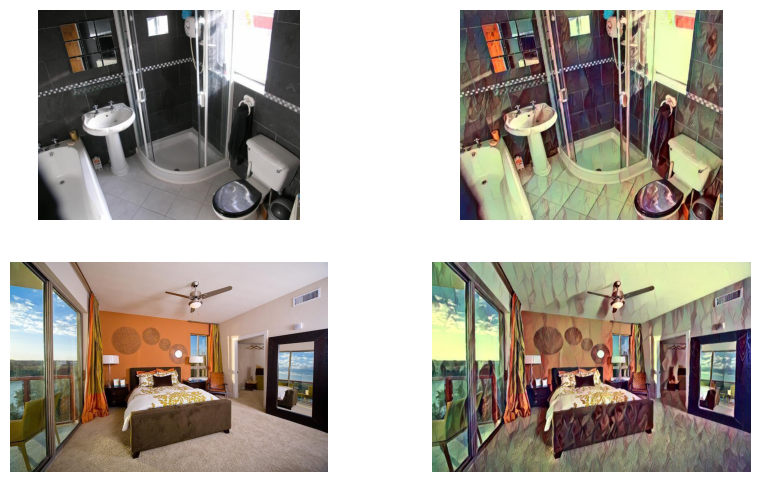

In [140]:
IMG_PATHS = ['original_images/washroom.jpg', 'original_images/interior-3.jpg']
MODEL_PATH = 'models/game.pth'
styled_imgs = []
for img in IMG_PATHS:
    styled_imgs.append(inference(img, MODEL_PATH))
    
plot_image_grid(IMG_PATHS, styled_imgs)

- we can see that it is producing relatively better results in this images

## Limitations


- the dataset used for training was mostly of interior images, so for some of the style images the model is not giving good results on new images.


## Potential improvements


- if a more generalized dataset is used, the model can give good results on the all types of images.
- if we tune the style and content weights more, the model will perform better
- the choice of the style image is also important, as it should be representing homogeneous art style. So using a good style image, we can create some good performing models.